In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
from nilearn import plotting

# Plot method

In [2]:
def plot_z_slices(img, n_rows, n_cols, title = None, output_file = None):
    all_coords = plotting.find_cut_slices(
        img, direction = "z", n_cuts = n_rows*n_cols)
    ax_size = 3.0
    margin = 0.05
    fig, all_axes = plt.subplots(n_rows,n_cols,figsize=(n_rows * ax_size, n_cols * ax_size),
                                 gridspec_kw={"hspace": margin, "wspace": margin},)
    left_right = True
    for coord, ax in zip(all_coords, all_axes.ravel()):
        display = plotting.plot_stat_map(img, cut_coords=[coord], display_mode="z", axes=ax, annotate=False)
        display.annotate(left_right=left_right)
        # only show L R on the first (top left) axis
        left_right = False
        if title:
            plt.suptitle(title, fontsize=15)
        if output_file:
            plt.savefig(output_file)

In [145]:
def boxplot(df, name) : 
    palette = sns.color_palette("GnBu")
    sns.boxplot(df,palette = palette).set( xlabel='Game Events', ylabel='Validation Accuracy')
    sns.stripplot(data = df,  palette='dark:c',size = 4)
    print('Mean Validation Accuracy across events : ', np.mean(df.mean()), 'std : ', np.std(df.mean()))
    plt.xticks(rotation=45)
    plt.title (f'Validation accuracy distribution between folds relatively to game events ({name})')
    plt.ylim([0.75, 1])
    plt.tight_layout()
    plt.savefig(f'Decoder_Mean_accuracy_{name}.png')
    plt.show()

# Nilearn Decoder

In [165]:
## Loading the decoder
decoderdir_log = 'logs/decoder_CV_per_run/train_decoder_logistic.sav'
decoder_log = pickle.load(open(decoderdir_log, 'rb'))
decoderdir_svc = 'logs/decoder_CV_per_run/train_decoder_svc.sav'
decoder_svc = pickle.load(open(decoderdir_svc, 'rb'))

/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LinearSVC from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


Mean Validation Accuracy across events :  0.894527280299875 std :  0.05051868921965364


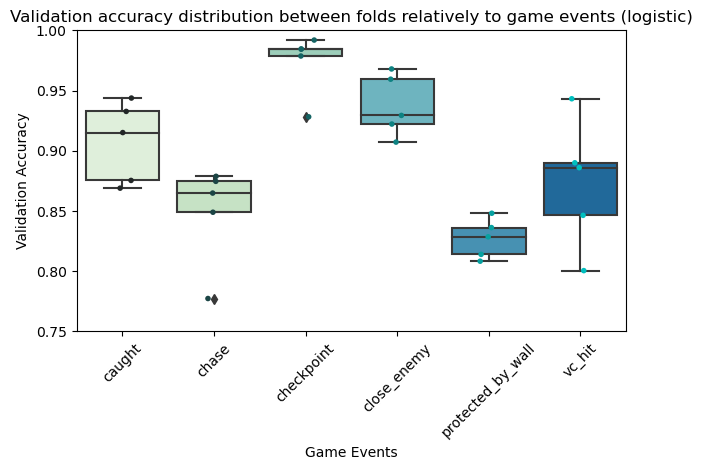

In [147]:
boxplot(pd.DataFrame.from_dict(decoder_log.cv_scores_), 'logistic')

/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/seaborn/categorical.py:470: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


Mean Validation Accuracy across events :  0.8922921005136749 std :  0.06091860064968697


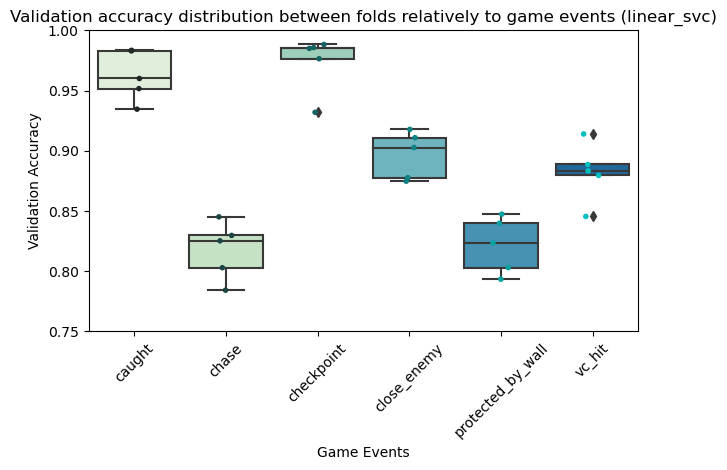

In [148]:
boxplot(pd.DataFrame.from_dict(decoder_svc.cv_scores_), 'linear_svc')

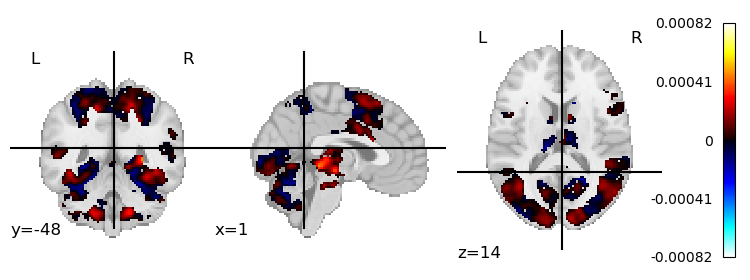

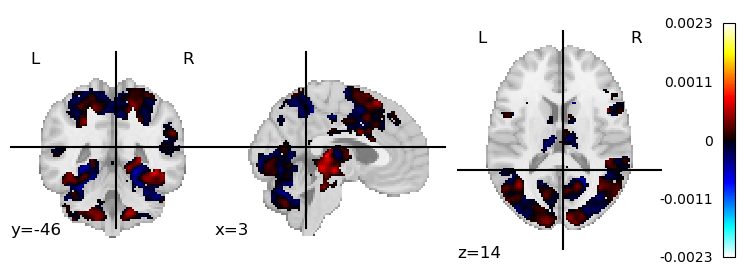

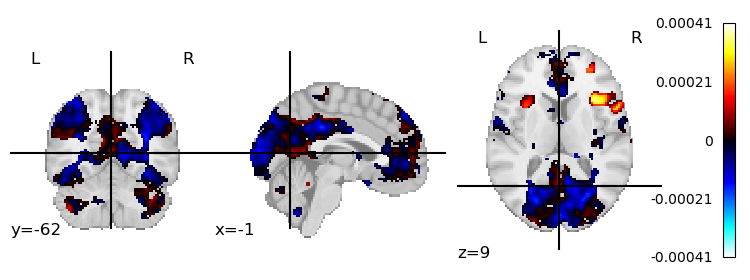

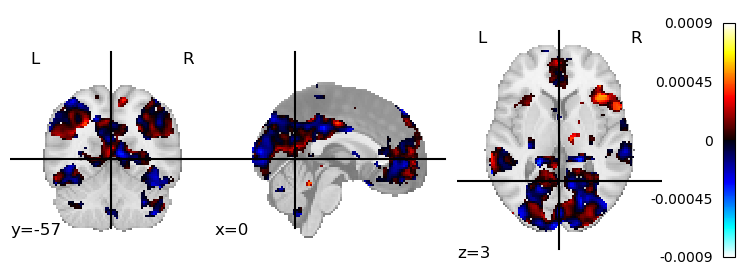

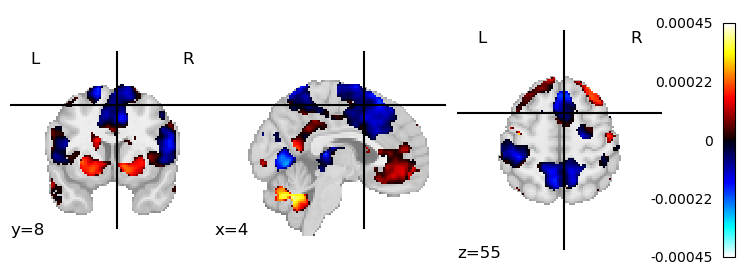

...

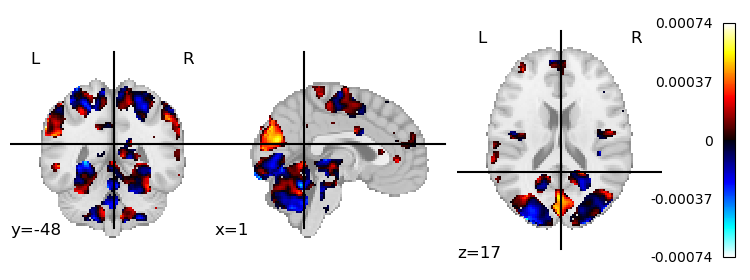

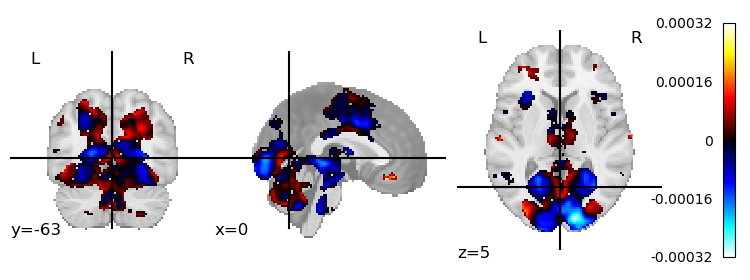

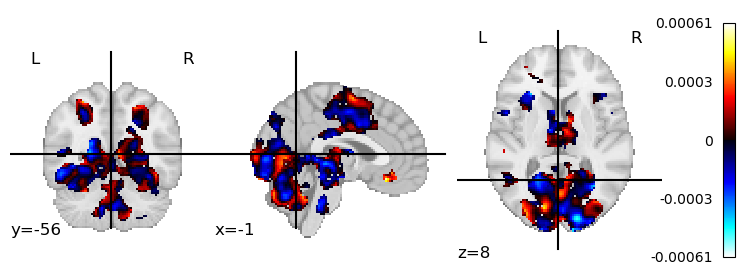

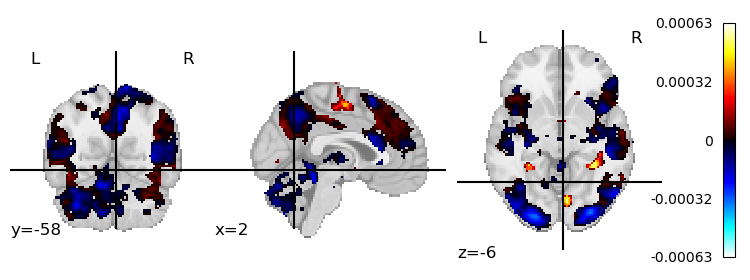

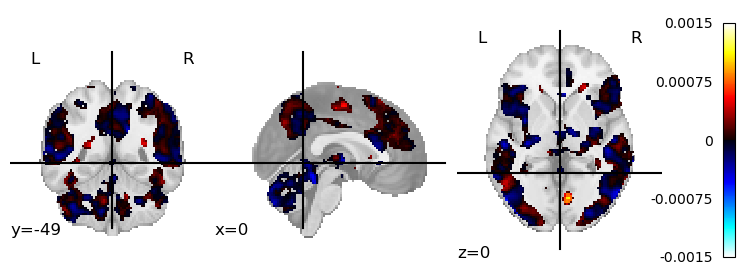

In [153]:
names = ['caught', 'chase', 'checkpoint', 'close_enemy', 'protected_by_wall', 'vc_hit']
for name in names  : 
    plotting.plot_stat_map(decoder_log.coef_img_[name])
    plt.savefig(f'stat_map_log_{name}')
    plotting.plot_stat_map(decoder_svc.coef_img_[name])
    plt.savefig(f'stat_map_svc_{name}')

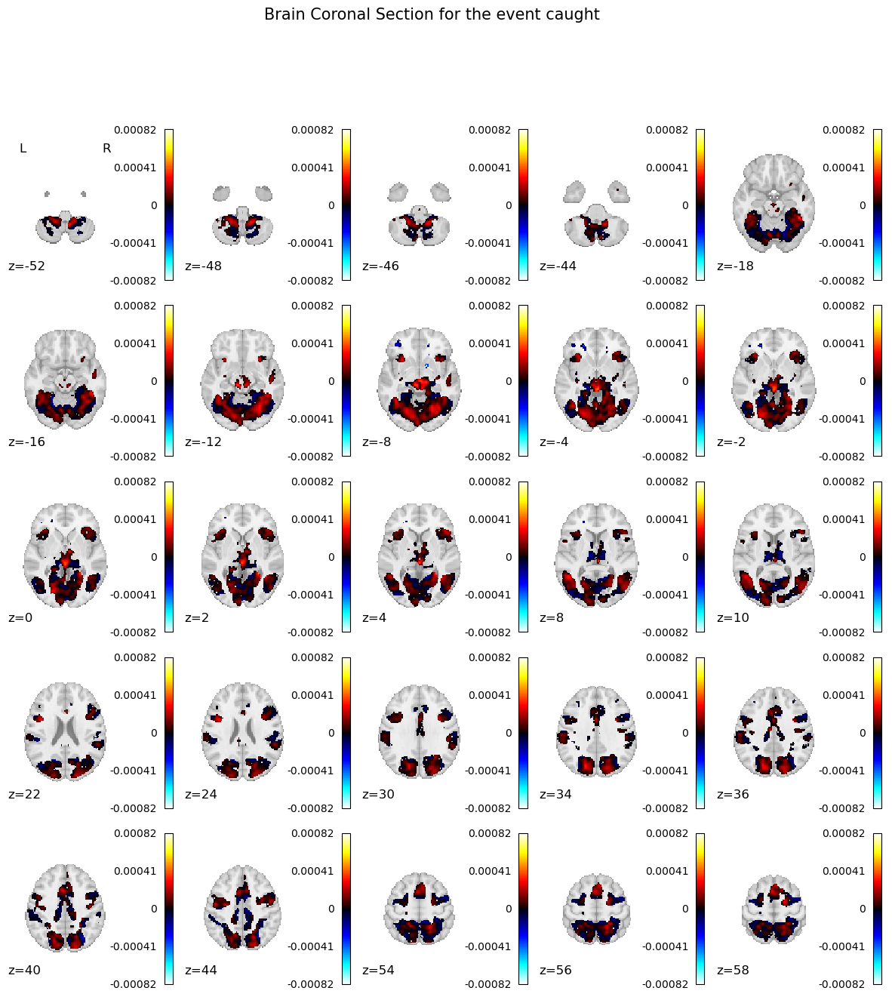

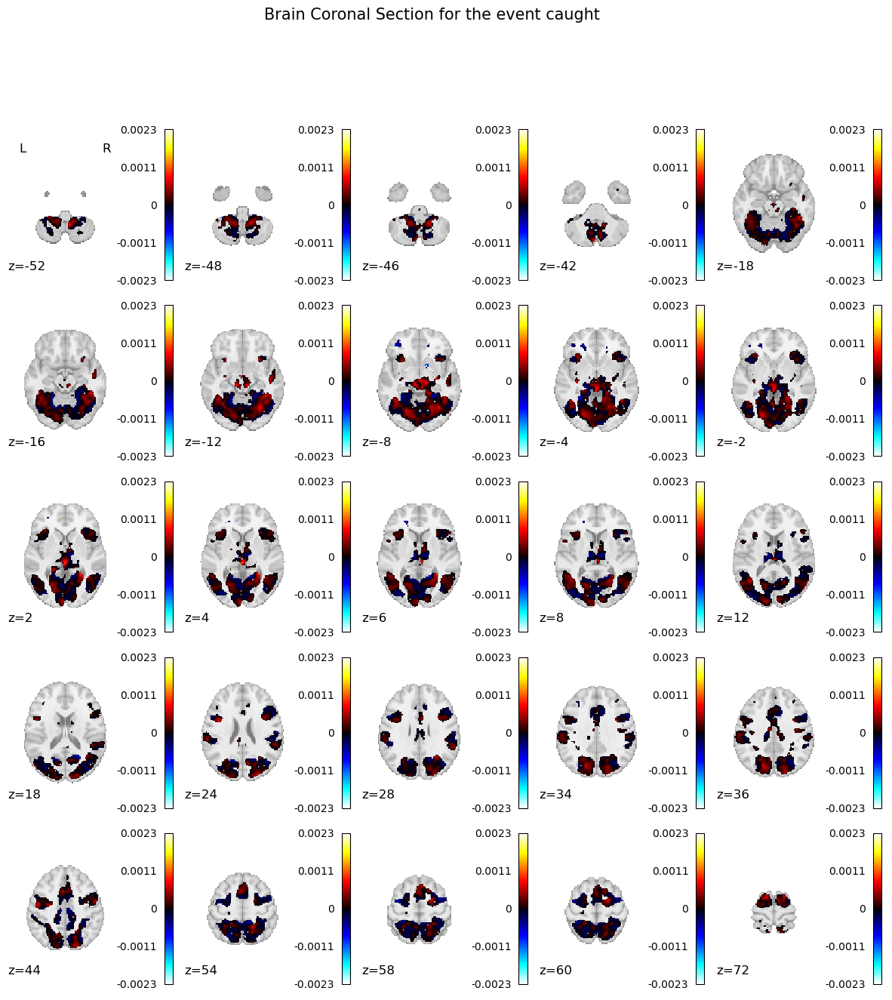

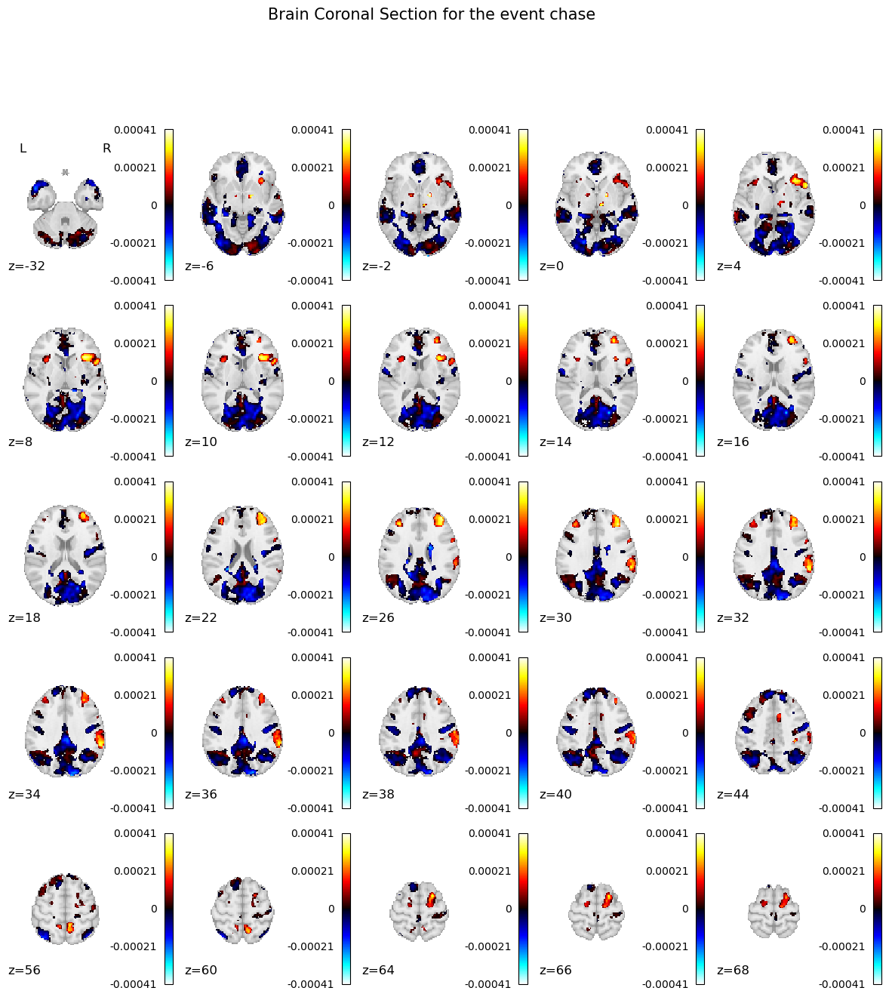

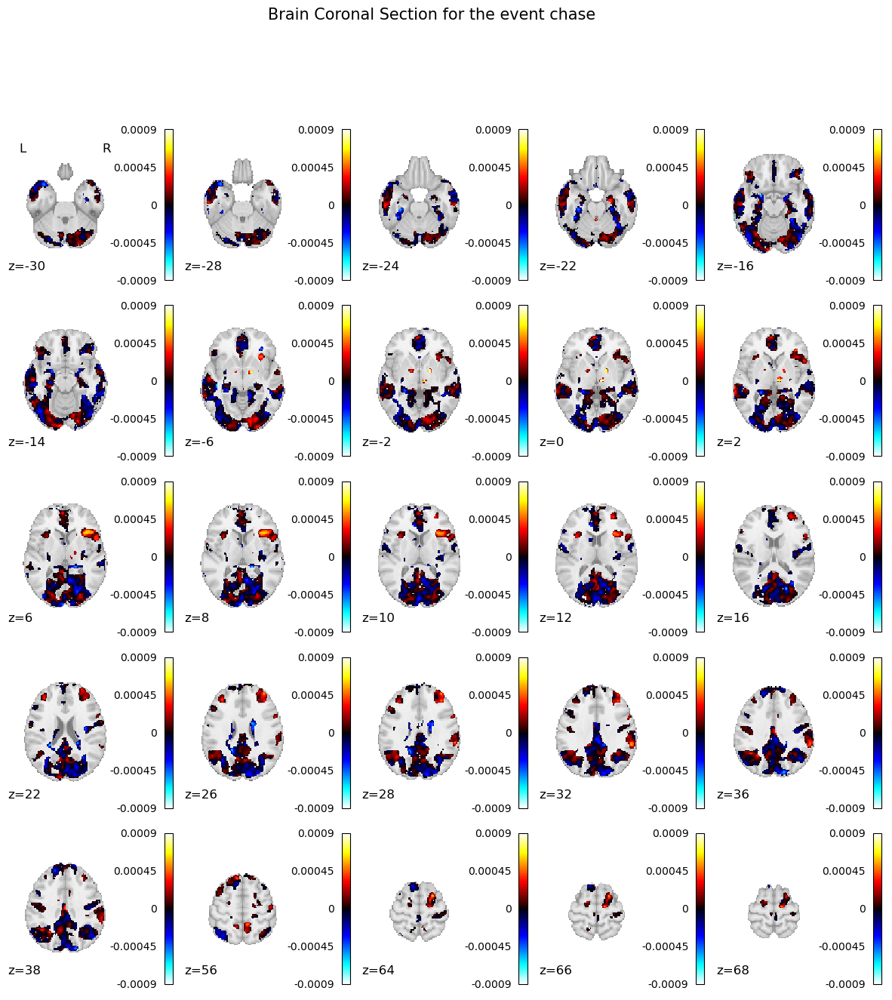

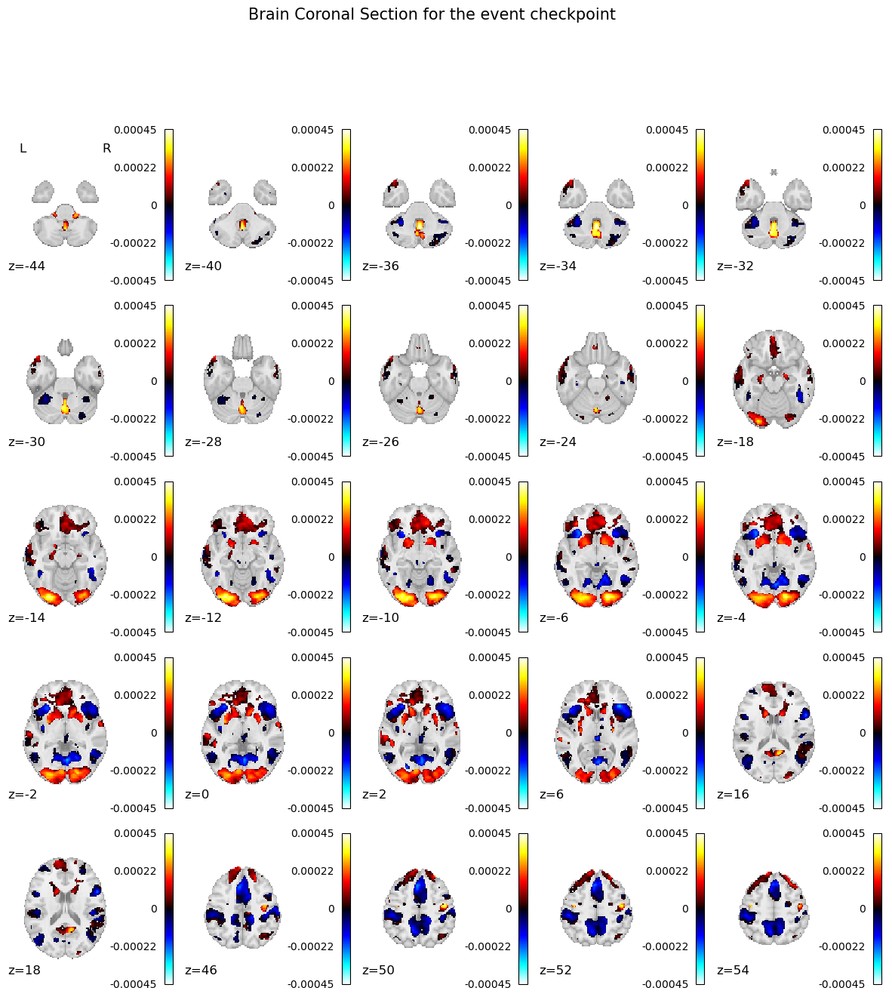

...

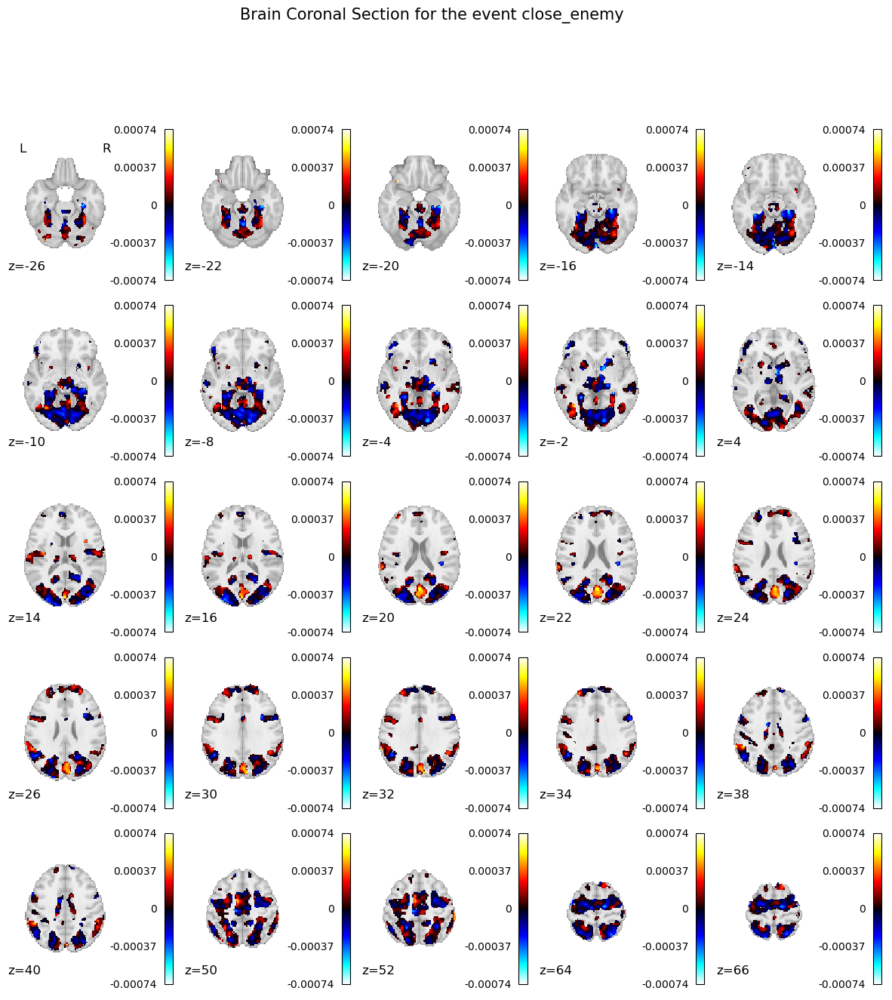

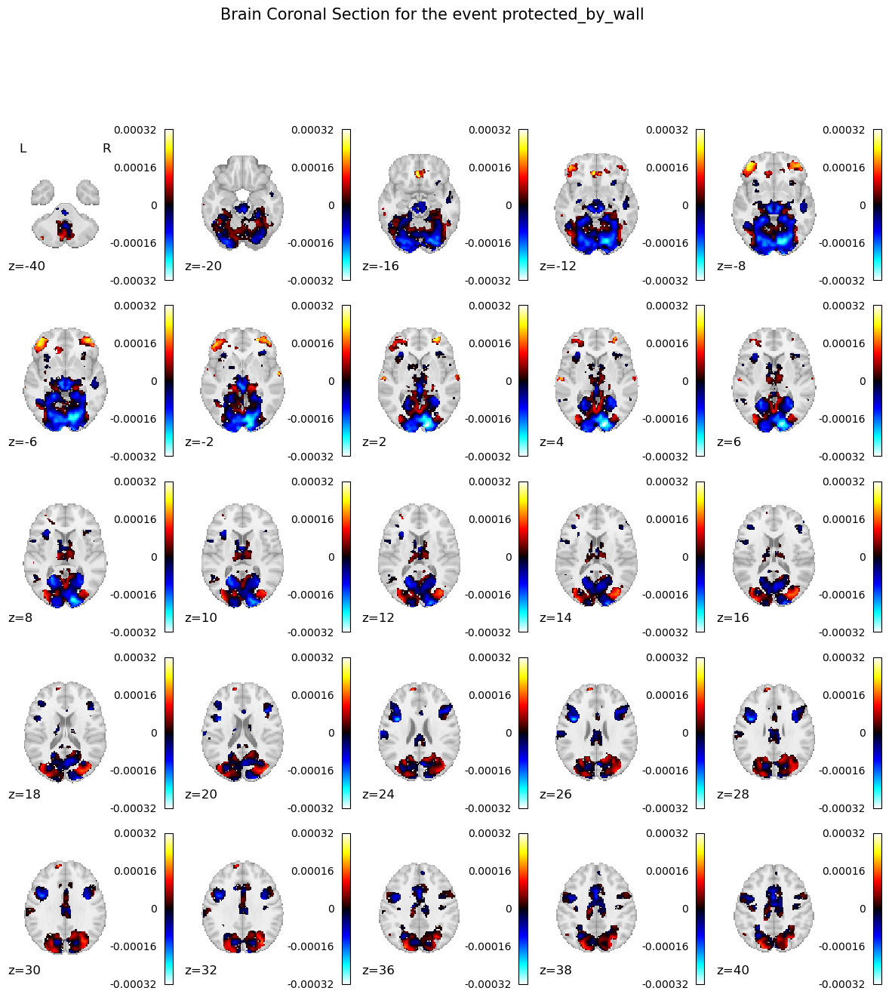

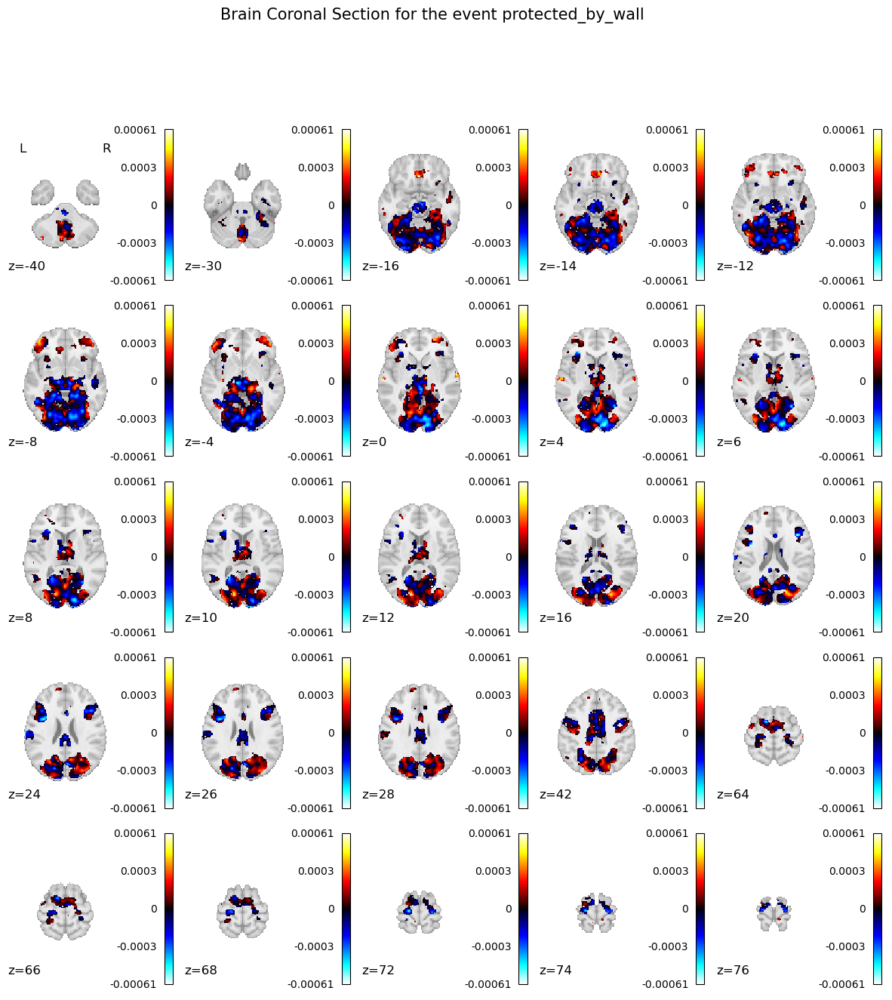

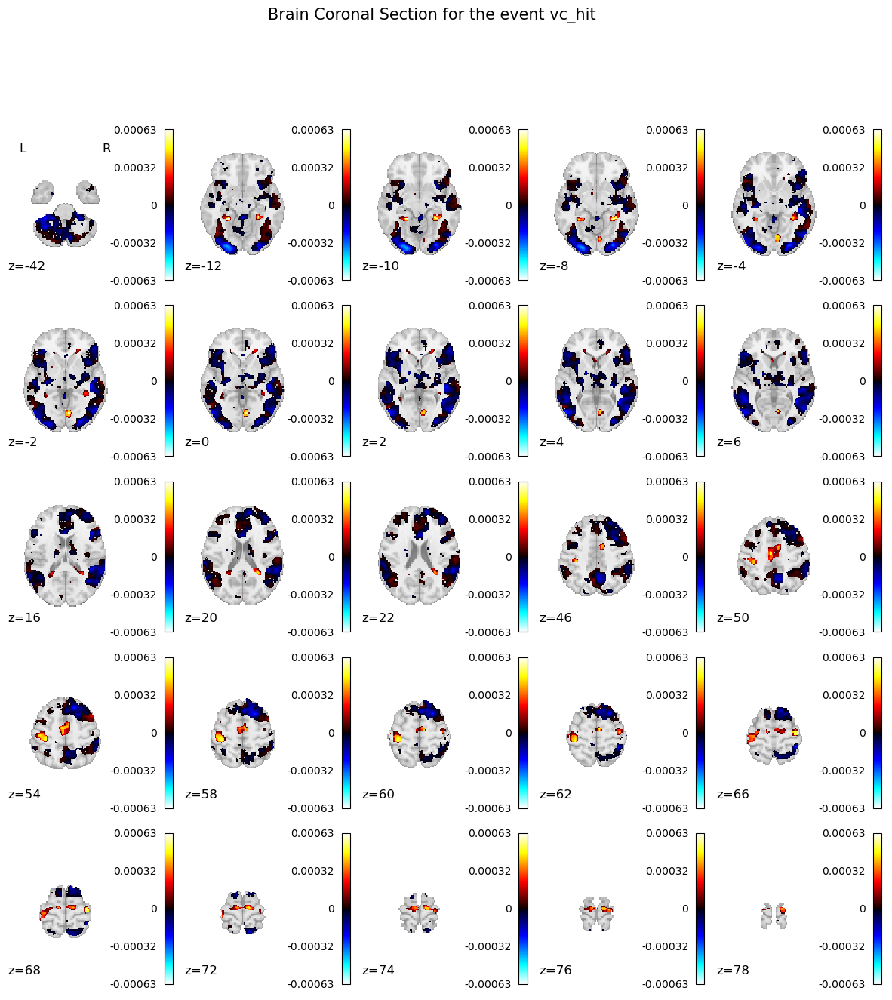

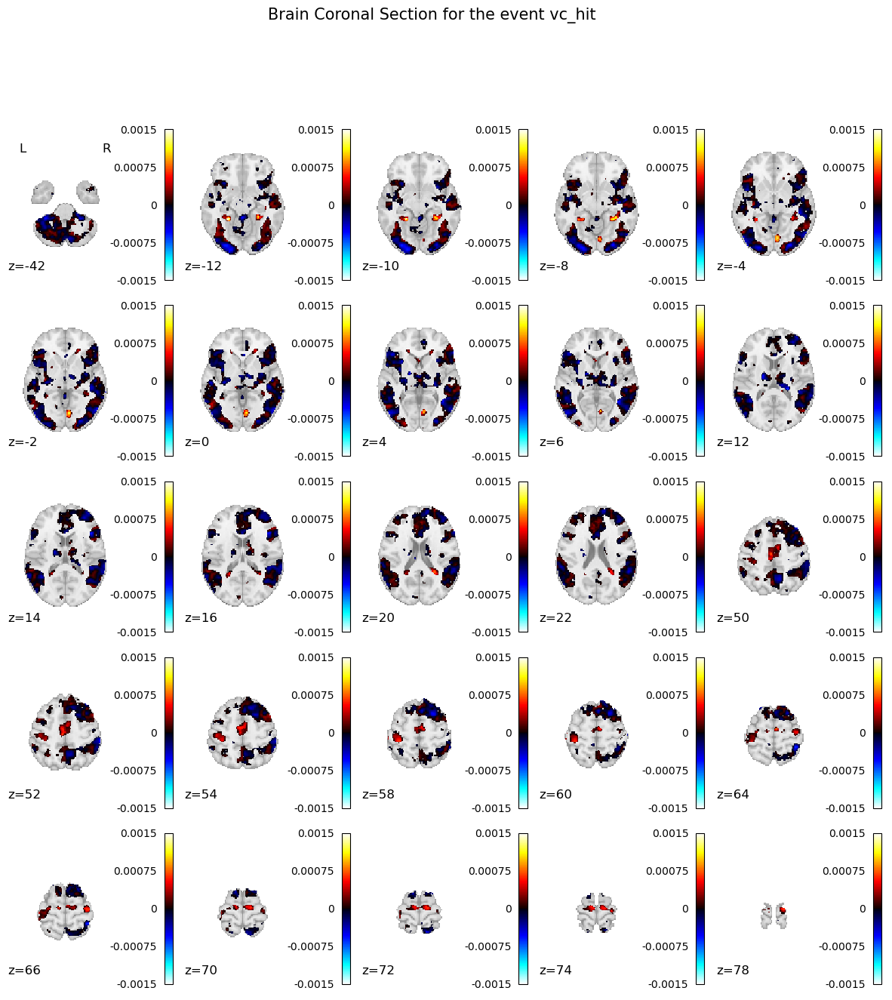

In [168]:
names = ['caught', 'chase', 'checkpoint', 'close_enemy', 'protected_by_wall', 'vc_hit']
for name in names  : 
    plot_z_slices(decoder_log.coef_img_[name], 5, 5, title=f'Brain Coronal Section for the event {name}', 
                 output_file = f'Decoding_logistic{name}')
    plot_z_slices(decoder_svc.coef_img_[name], 5, 5, title=f'Brain Coronal Section for the event {name}', 
                 output_file = f'Decoding_svc{name}')

# SpaceNet 

In [3]:
## Load Accuracy for each model

graph_net=[]
tv_l1=[]
alphas = [0.1, 1, 10, 100]

for alpha in alphas:
    path = f'logs/spacenet_CV_per_run_graph-net/trained_spacenet_{alpha}.sav'
    graph_net.append( pickle.load(open(path, 'rb'))['accuracies'])
    path_ = f'logs/spacenet_CV_per_run_tv-l1/trained_spacenet_{alpha}.sav'
    tv_l1.append(pickle.load(open(path_, 'rb'))['accuracies'])

/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LabelBinarizer from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Mean accuracy Graphe-Net, for alpha =  0.1 , 0.76 +/- 0.06
Mean accuracy Graphe-Net, for alpha =  0.1 , 0.76 +/- 0.06


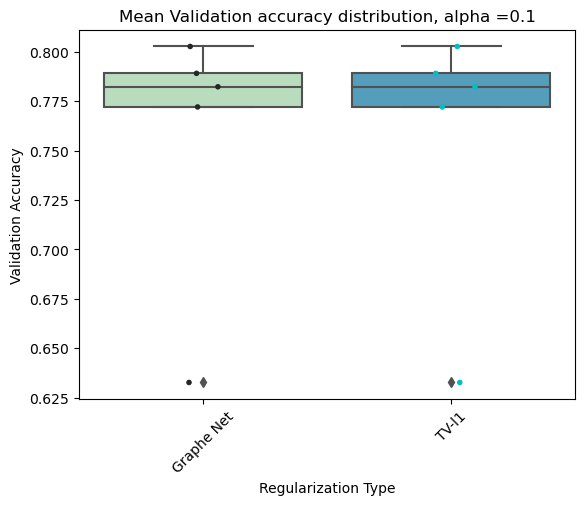

Mean accuracy Graphe-Net, for alpha =  1 , 0.76 +/- 0.06
Mean accuracy Graphe-Net, for alpha =  1 , 0.76 +/- 0.06


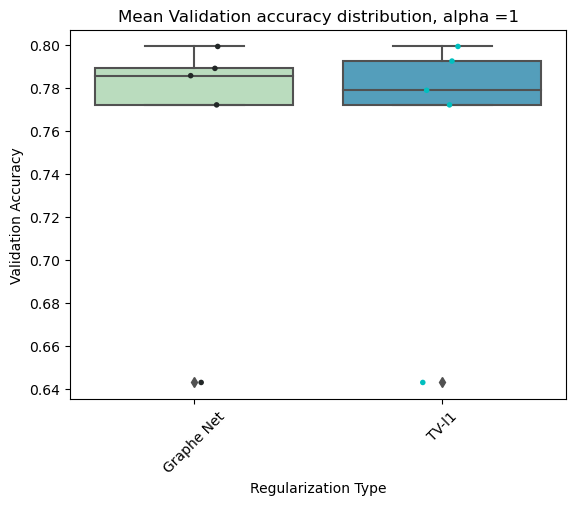

Mean accuracy Graphe-Net, for alpha =  10 , 0.73 +/- 0.06
Mean accuracy Graphe-Net, for alpha =  10 , 0.7 +/- 0.05


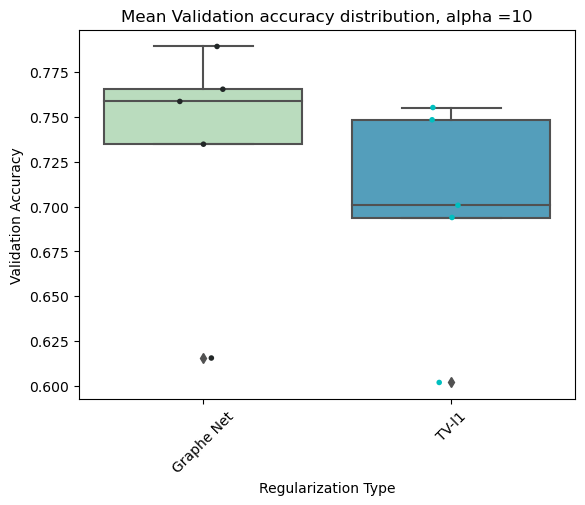

Mean accuracy Graphe-Net, for alpha =  100 , 0.63 +/- 0.02
Mean accuracy Graphe-Net, for alpha =  100 , 0.46 +/- 0.02


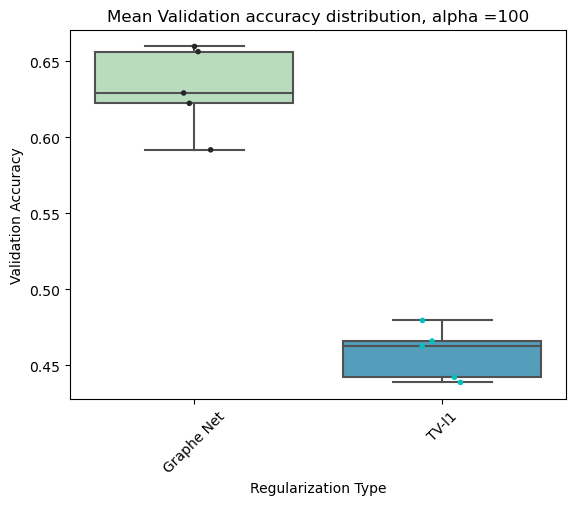

In [88]:
## Comparison bewteen the two Regularization

for i in range(0,4): 
    
    print('Mean accuracy Graphe-Net, for alpha = ', alphas[i], ',' , 
          round(np.mean(graph_net[i]), 2), '+/-',  round(np.std(graph_net[i]), 2))
    
    print('Mean accuracy Graphe-Net, for alpha = ', alphas[i],',',
          round(np.mean(tv_l1[i]), 2), '+/-',  round(np.std(tv_l1[i]), 2))
    
    palette = sns.color_palette("GnBu",  n_colors=2)
    sns.boxplot(data=[graph_net[i], tv_l1[i]], palette= palette).set(
    xlabel='Regularization Type', 
    xticklabels=['Graphe Net', 'TV-l1'],
    ylabel='Validation Accuracy')
    
    
    sns.stripplot(data =[graph_net[i], tv_l1[i]], palette='dark:c',size = 4)
    plt.xticks(rotation=45)
    plt.title ('Mean Validation accuracy distribution, alpha ={}'.format(alphas[i]))
    plt.show()

In [4]:
## Load Models
path_graph = 'logs/spacenet_CV_per_run_graph-net/trained_spacenet_1.sav'
graph=pickle.load(open(path_graph, 'rb'))

path_tv_l1 = 'logs/spacenet_CV_per_run_tv-l1/trained_spacenet_1.sav'
tv_l1 = pickle.load(open(path_tv_l1, 'rb'))

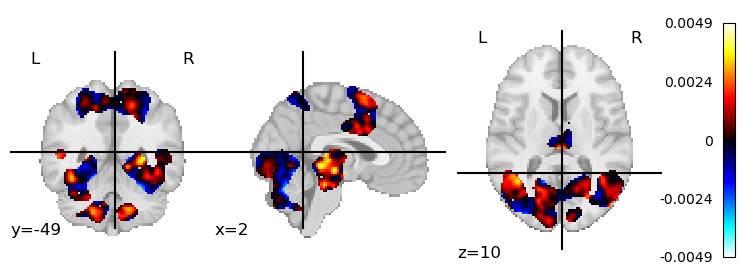

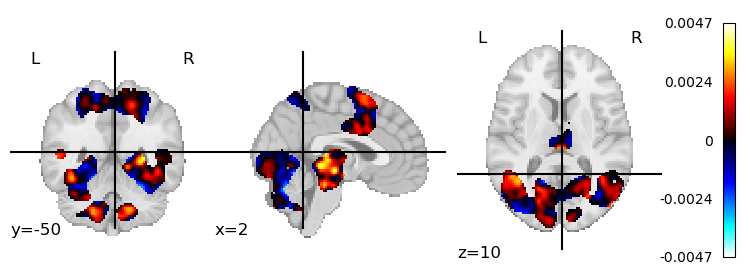

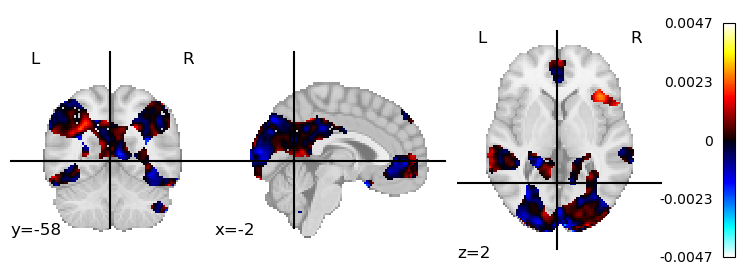

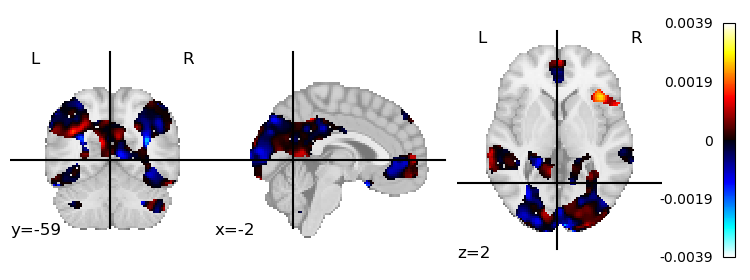

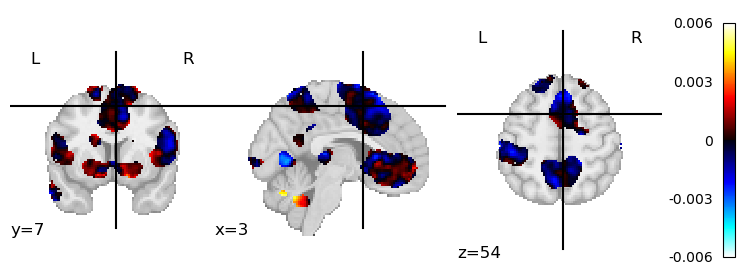

...

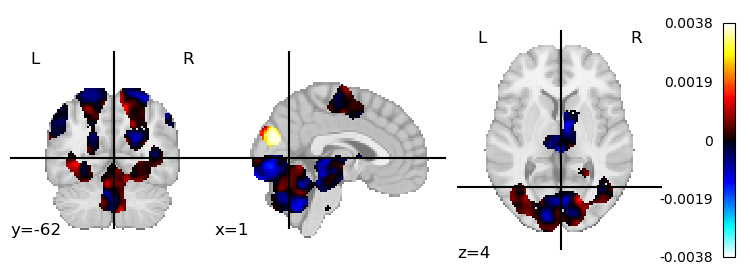

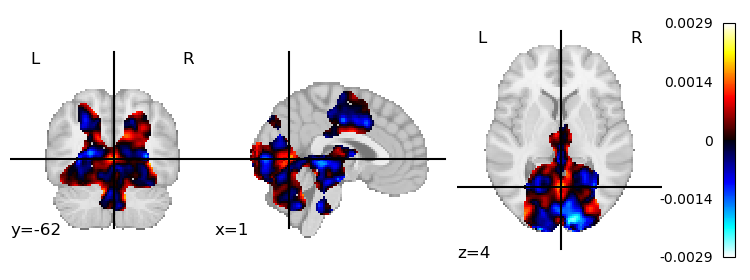

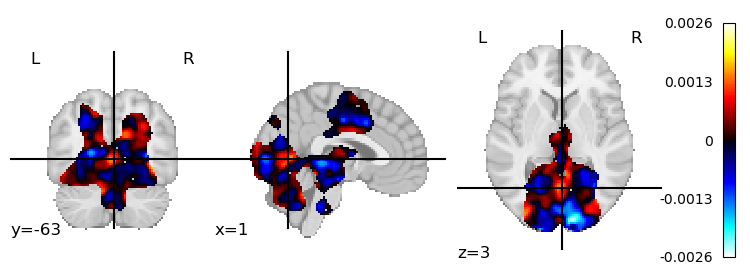

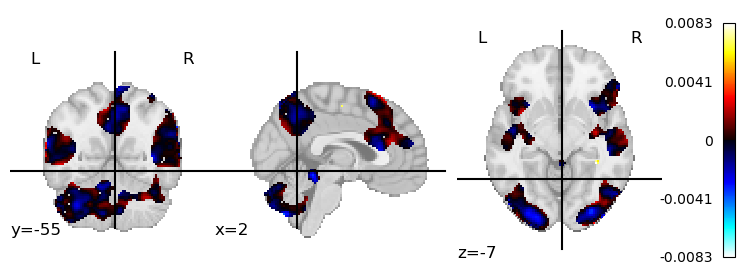

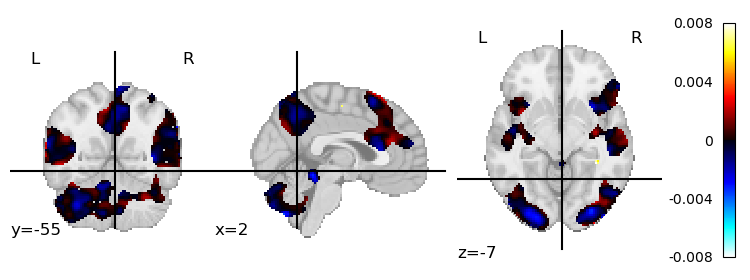

In [167]:
for i in range(0,6)  : 
    plotting.plot_stat_map(graph['trained_decoder'].coef_img_.slicer[...,i])
    plt.savefig(f'stat_map_graph_{names[i]}')
    plotting.plot_stat_map(tv_l1['trained_decoder'].coef_img_.slicer[...,i])
    plt.savefig(f'stat_map_tv_l1_{names[i]}')

In [6]:
names = ['caught', 'chase', 'checkpoint', 'close_enemy', 'protected_by_wall', 'vc_hit']

/opt/anaconda3/envs/MVAP/lib/python3.8/site-packages/nilearn/plotting/img_plotting.py:300: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


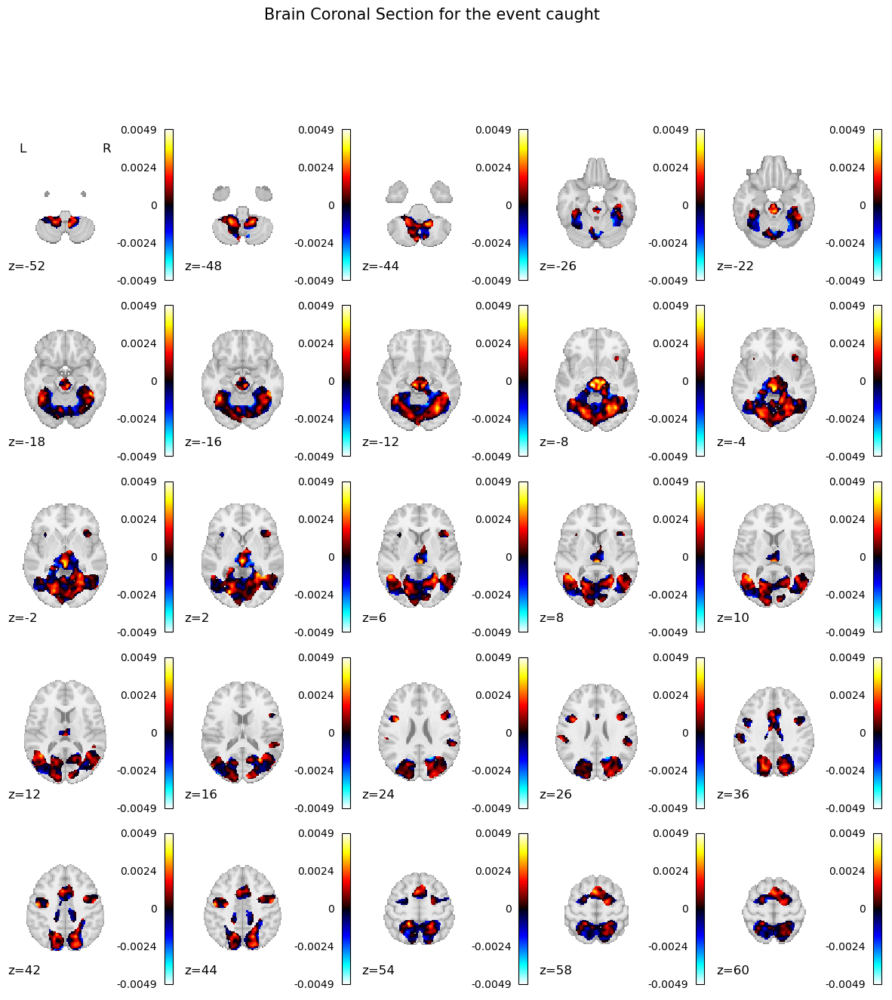

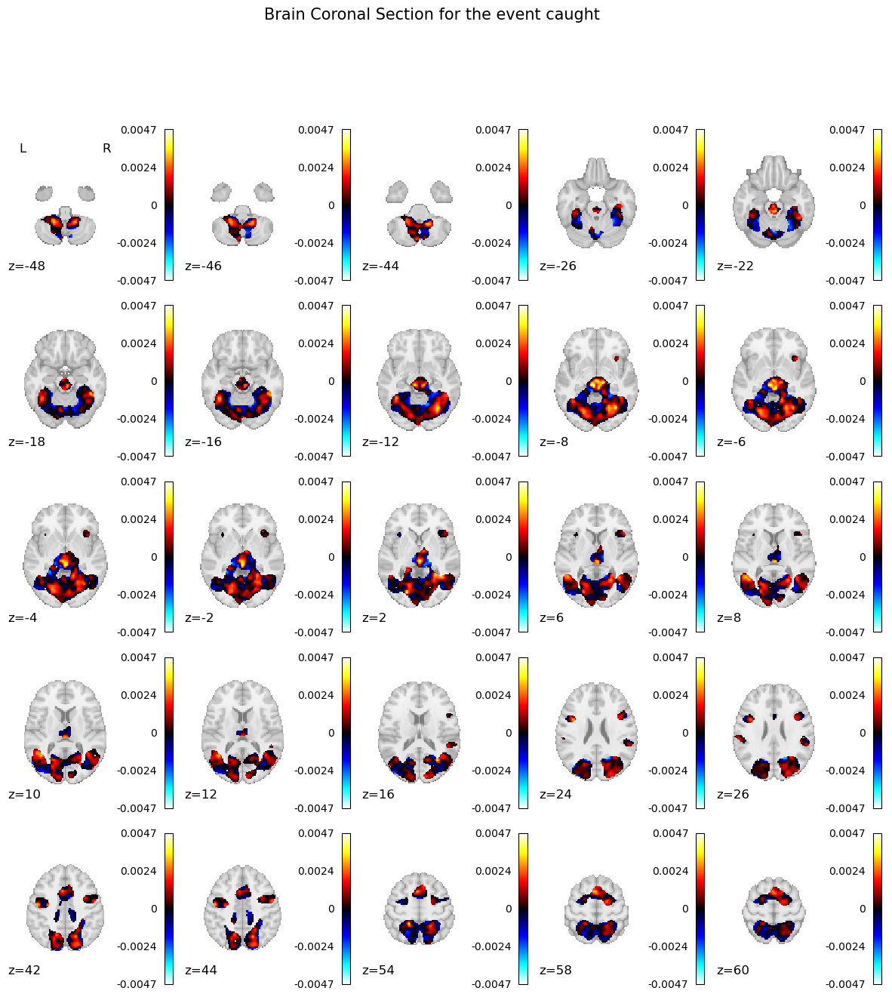

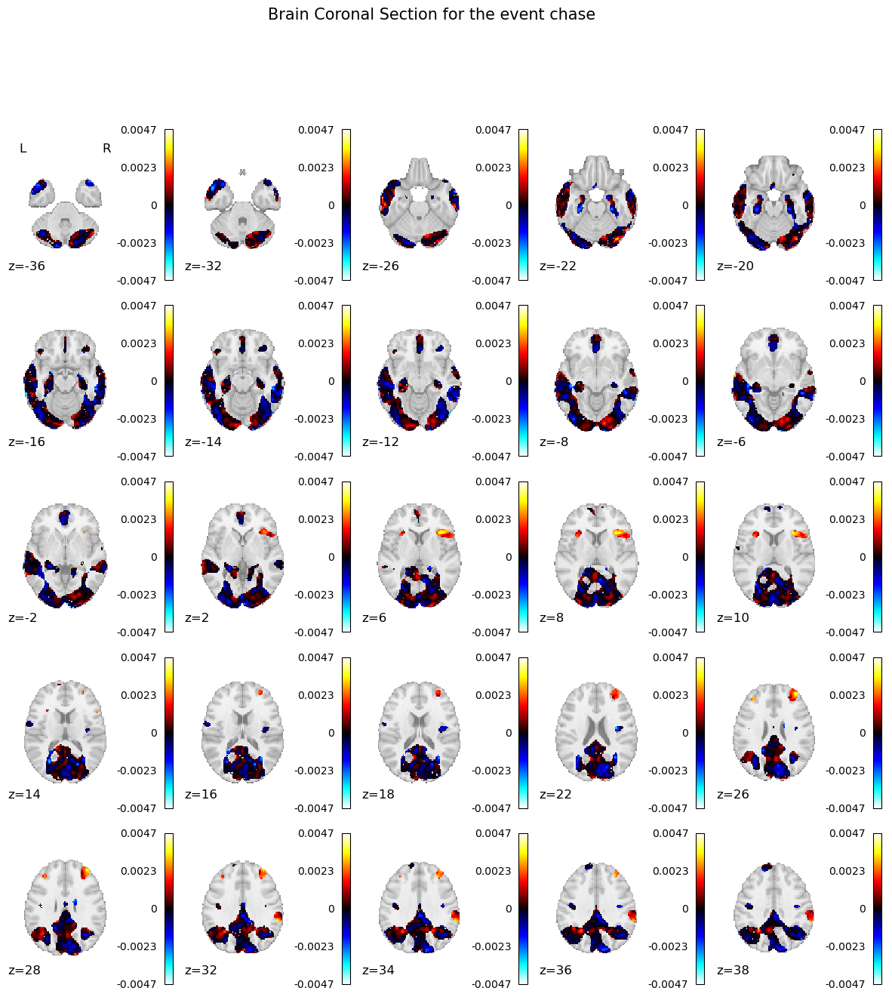

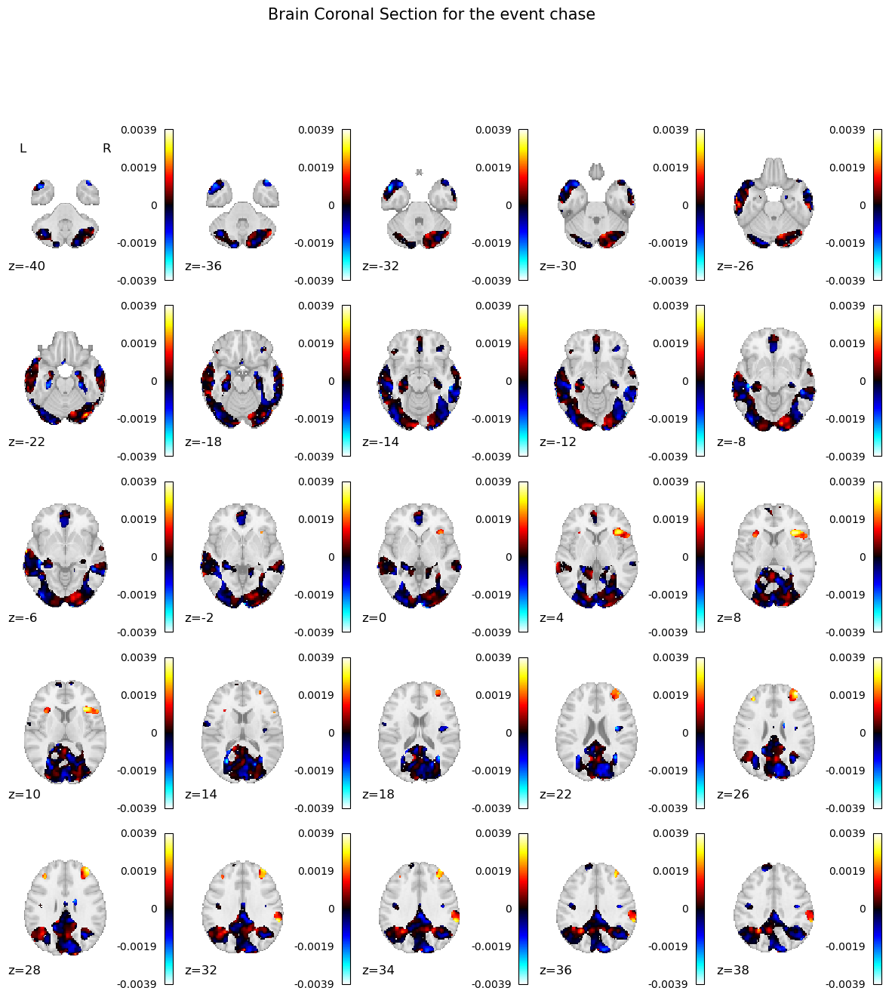

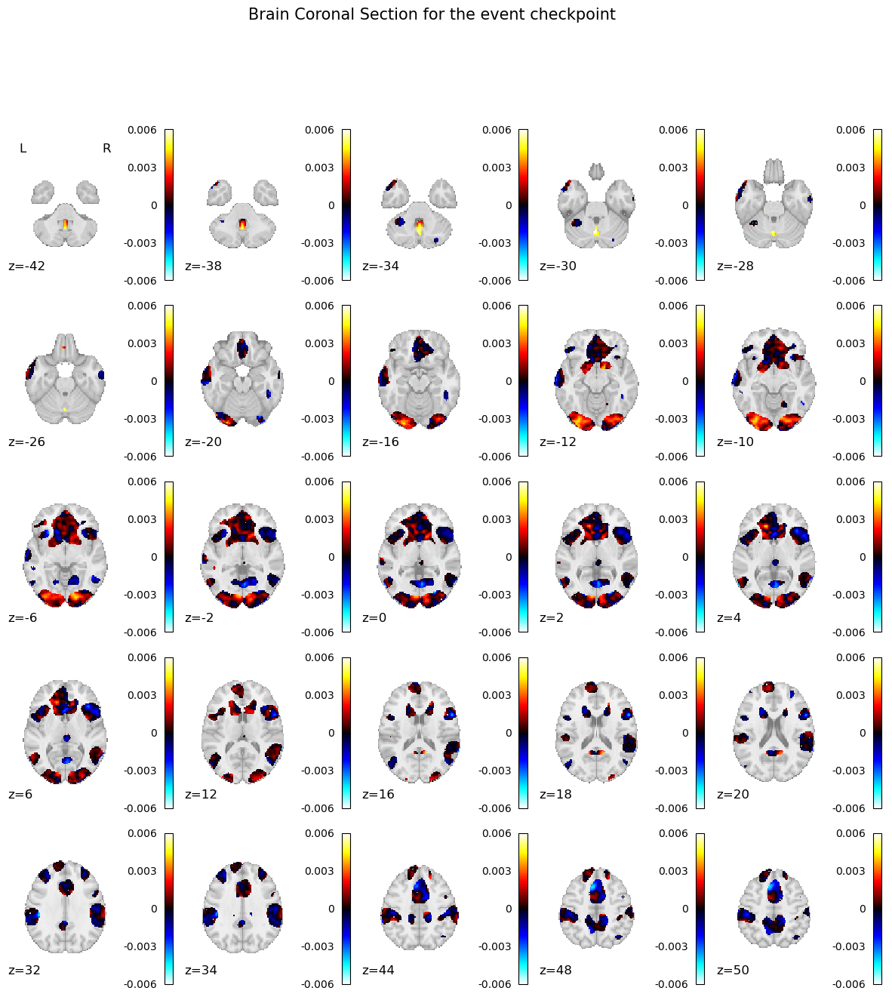

...

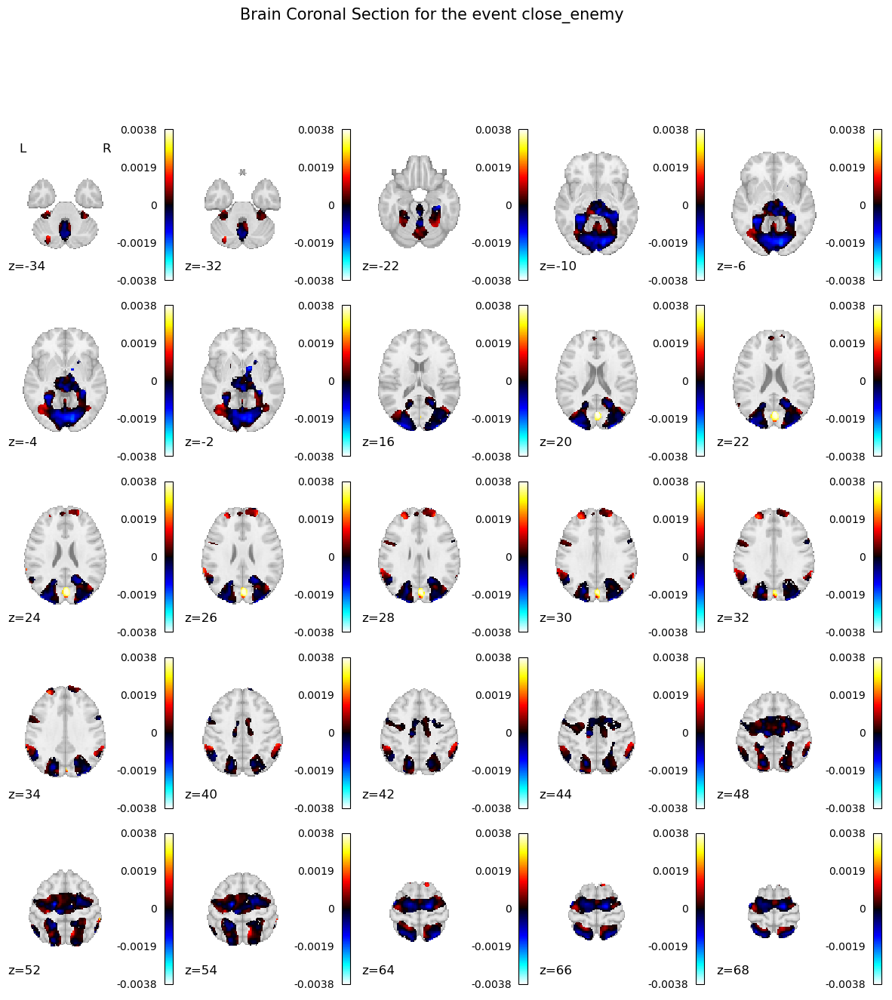

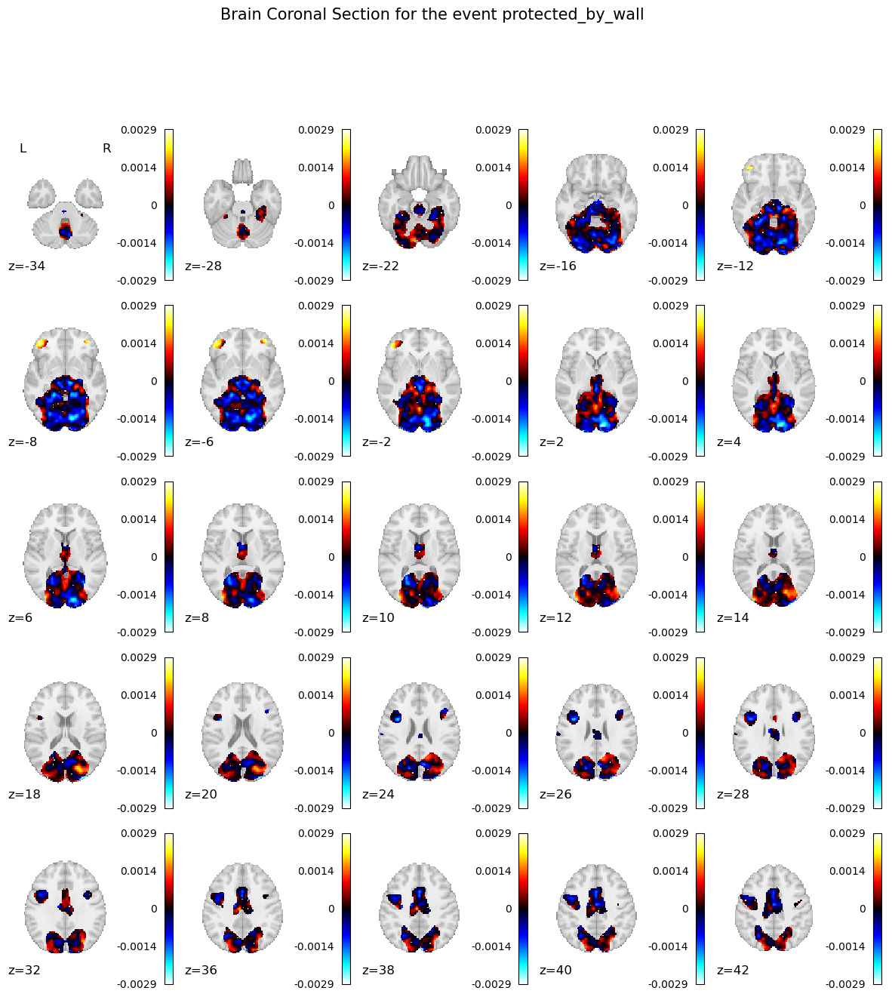

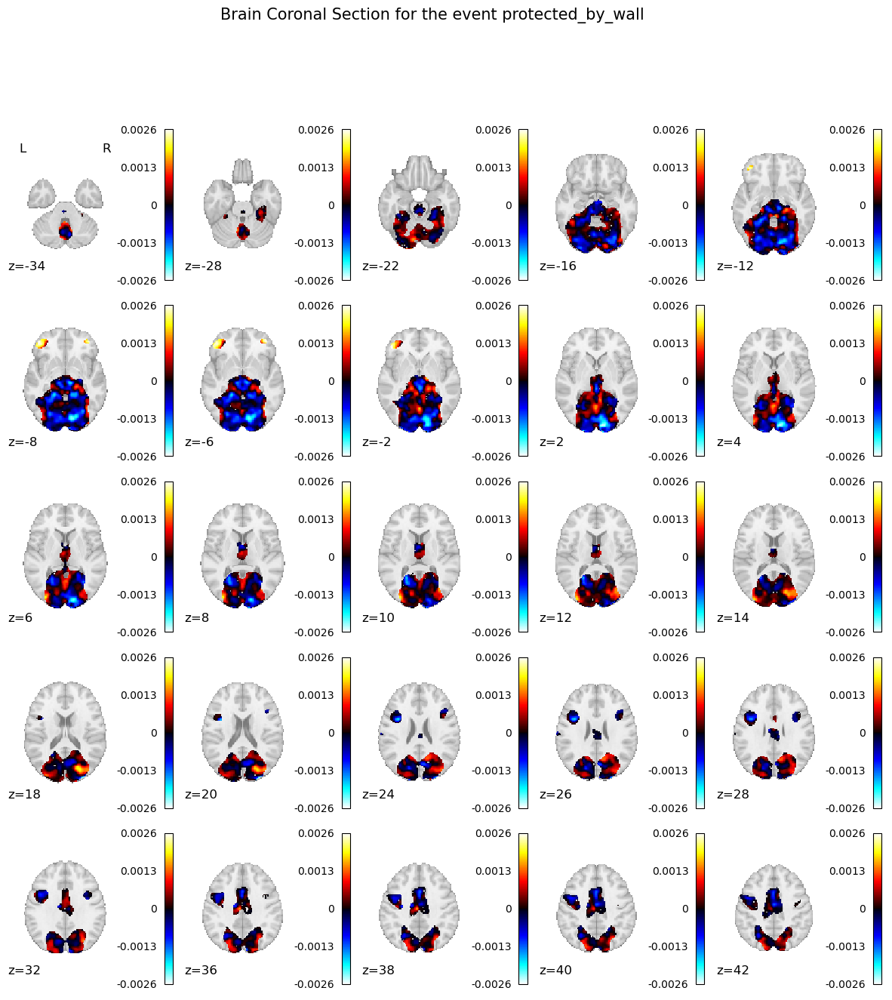

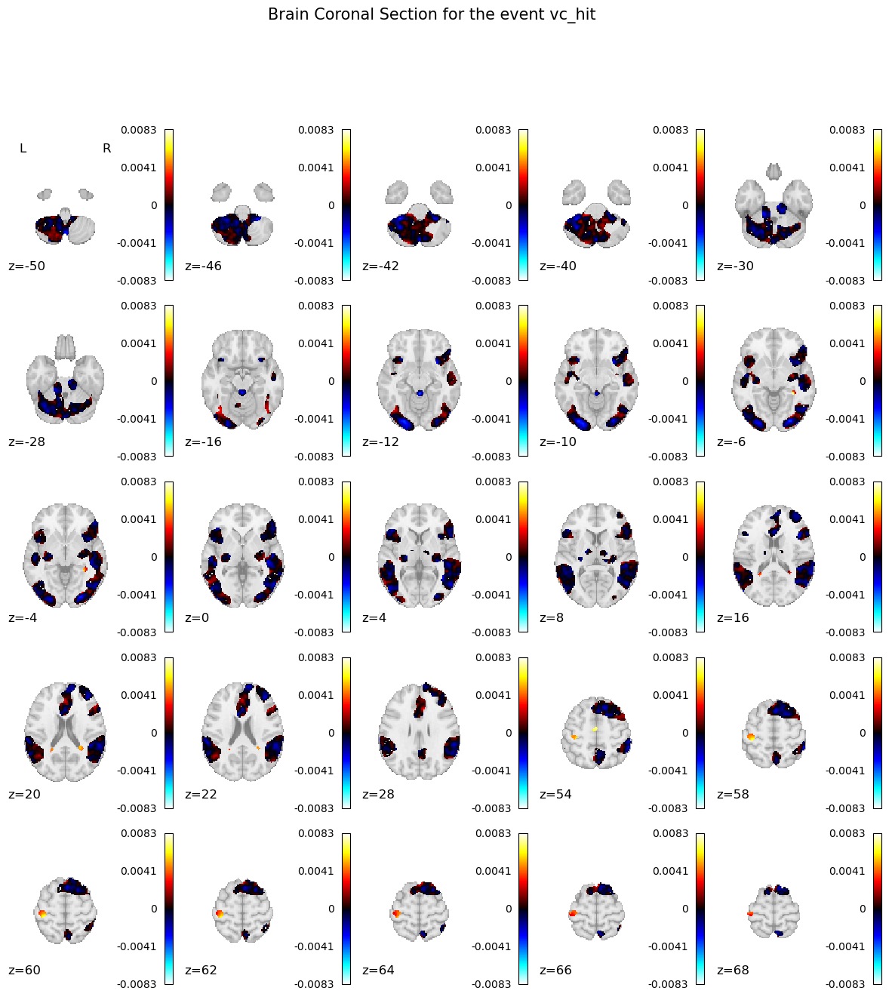

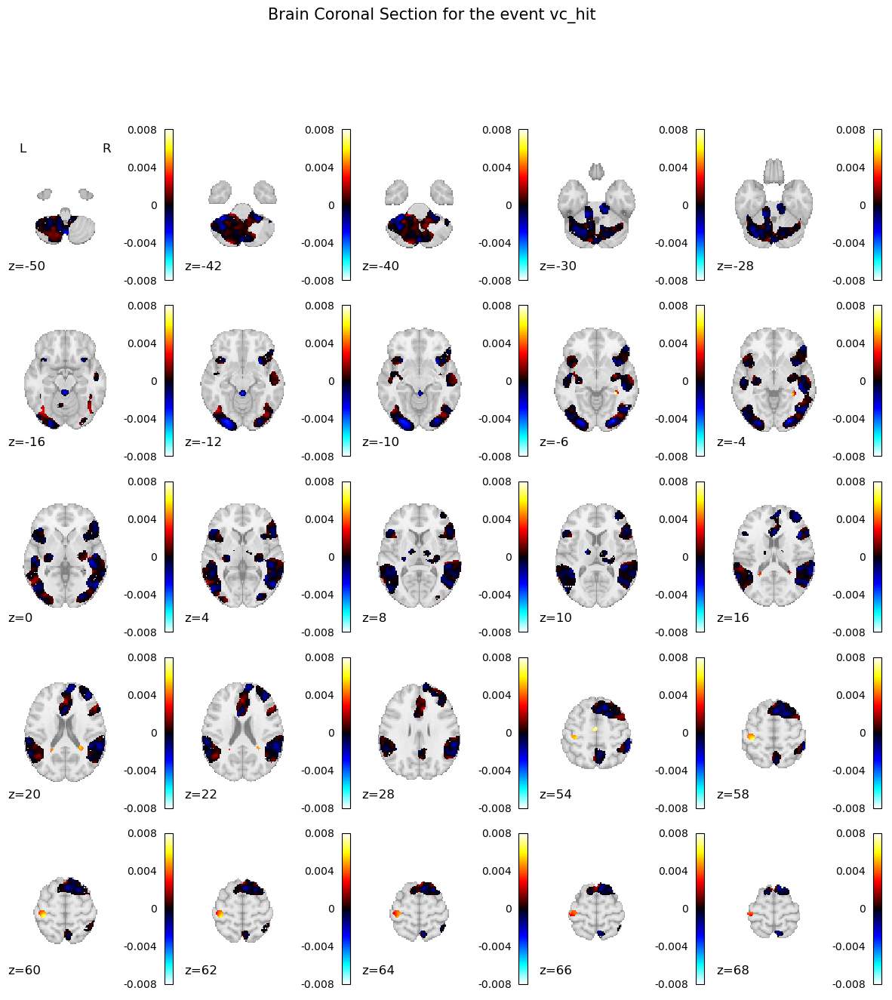

In [7]:
## Get brain images
for i in range(0,6)  :
    plot_z_slices(graph['trained_decoder'].coef_img_.slicer[...,i], 5, 5,
                 title = f'Brain Coronal Section for the event {names[i]}', 
                 output_file = f'GraphNet_{names[i]}')
    
    plot_z_slices(tv_l1['trained_decoder'].coef_img_.slicer[...,i], 5, 5,
                 title = f'Brain Coronal Section for the event {names[i]}', 
                  output_file = f'TV_L1_{names[i]}')
    
